In [5]:
import pandas as pd
df=pd.read_csv("Sheet1.csv")

In [2]:
df.shape

(3998, 39)

In [3]:
df.head

<bound method NDFrame.head of      Unnamed: 0      ID     Salary           DOJ           DOL  \
0         train  203097   420000.0   6/1/12 0:00       present   
1         train  579905   500000.0   9/1/13 0:00       present   
2         train  810601   325000.0   6/1/14 0:00       present   
3         train  267447  1100000.0   7/1/11 0:00       present   
4         train  343523   200000.0   3/1/14 0:00   3/1/15 0:00   
...         ...     ...        ...           ...           ...   
3993      train   47916   280000.0  10/1/11 0:00  10/1/12 0:00   
3994      train  752781   100000.0   7/1/13 0:00   7/1/13 0:00   
3995      train  355888   320000.0   7/1/13 0:00       present   
3996      train  947111   200000.0   7/1/14 0:00   1/1/15 0:00   
3997      train  324966   400000.0   2/1/13 0:00       present   

                      Designation           JobCity Gender           DOB  \
0         senior quality engineer         Bangalore      f  2/19/90 0:00   
1               assistant

In [5]:
df.describe()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,...,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,6.637945e+05,3.076998e+05,77.925443,2008.087544,74.466366,5156.851426,1.925713,71.486171,5156.851426,0.300400,...,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,3.632182e+05,2.127375e+05,9.850162,1.653599,10.999933,4802.261482,0.262270,8.167338,4802.261482,0.458489,...,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,1.124400e+04,3.500000e+04,43.000000,1995.000000,40.000000,2.000000,1.000000,6.450000,2.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,71.680000,2007.000000,66.000000,494.000000,2.000000,66.407500,494.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,79.150000,2008.000000,74.400000,3879.000000,2.000000,71.720000,3879.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,85.670000,2009.000000,82.600000,8818.000000,2.000000,76.327500,8818.000000,1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,1.298275e+06,4.000000e+06,97.760000,2013.000000,98.700000,18409.000000,2.000000,99.930000,18409.000000,1.000000,...,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400


In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
numerical_cols = ['Salary', '10percentage', '12percentage', 'collegeGPA', 'English', 'Logical', 'Quant', 'ComputerProgramming']
categorical_cols = ['Designation', 'JobCity', 'Gender', 'Degree', 'Specialization', 'CollegeTier', 'CollegeState']


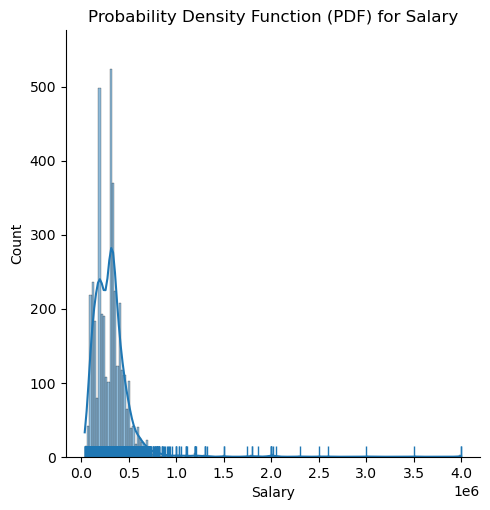

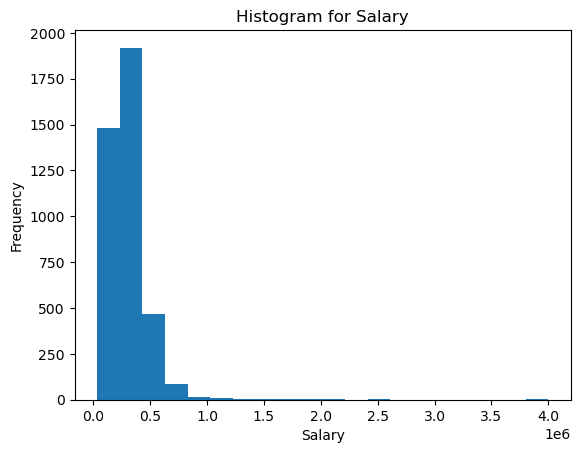

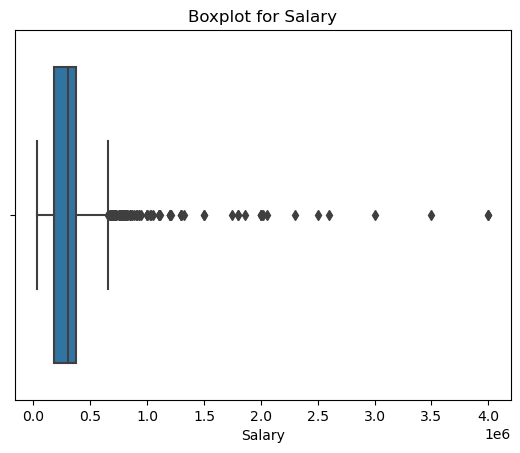

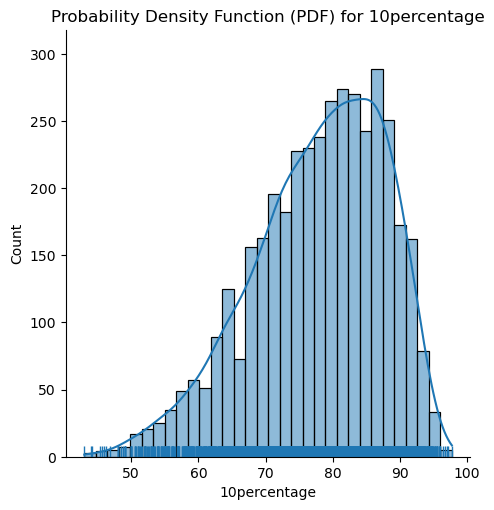

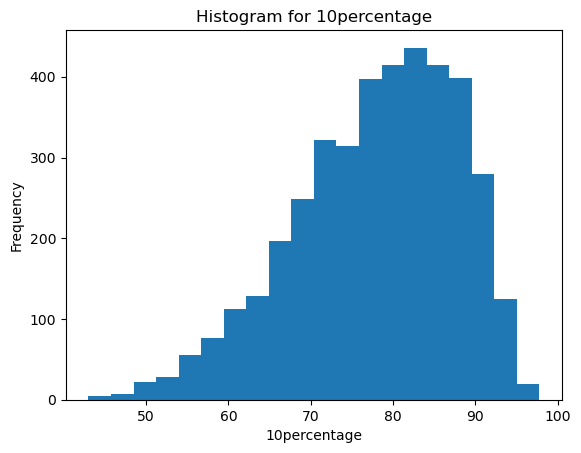

...

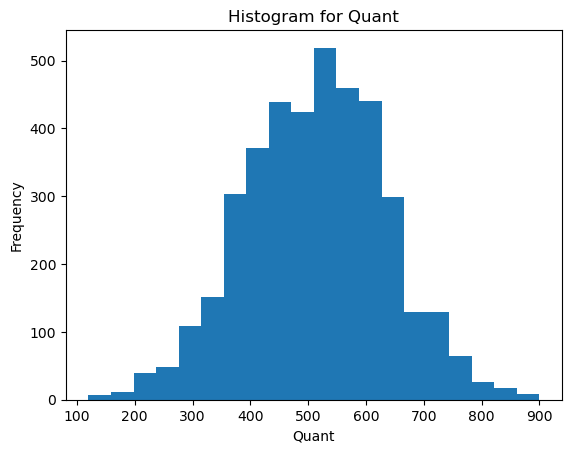

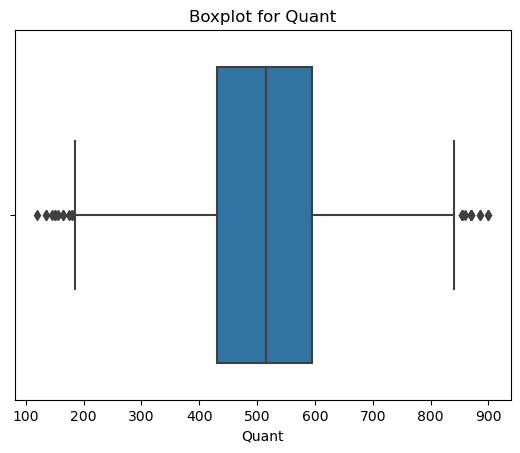

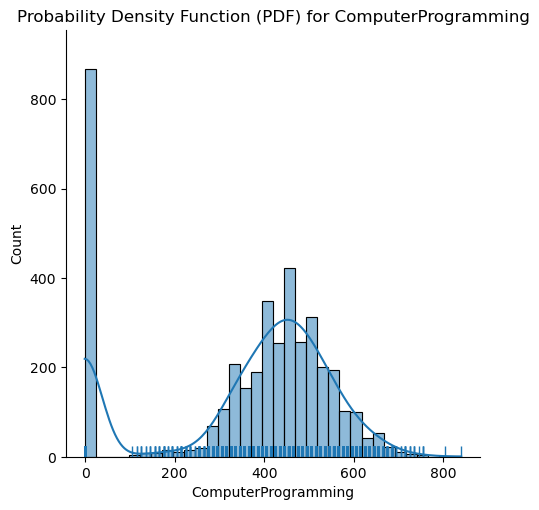

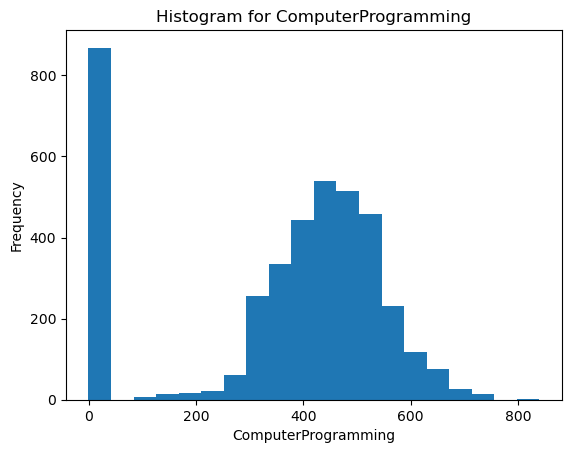

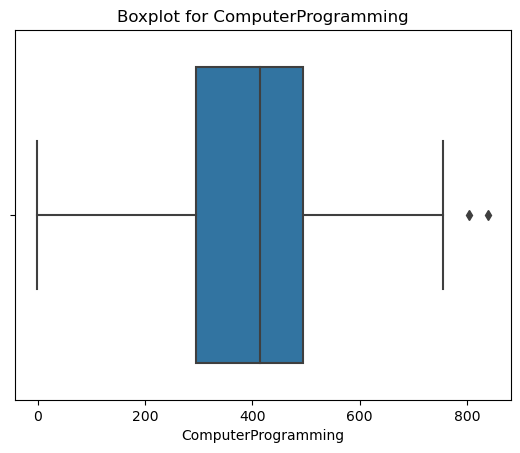

In [10]:
for col in numerical_cols:
    sns.displot(df[col], kde=True, rug=True)
    plt.title(f'Probability Density Function (PDF) for {col}')
    plt.show()
    plt.hist(df[col], bins=20)
    plt.title(f'Histogram for {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()
    
    # Boxplot
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot for {col}')
    plt.xlabel(col)
    plt.show()

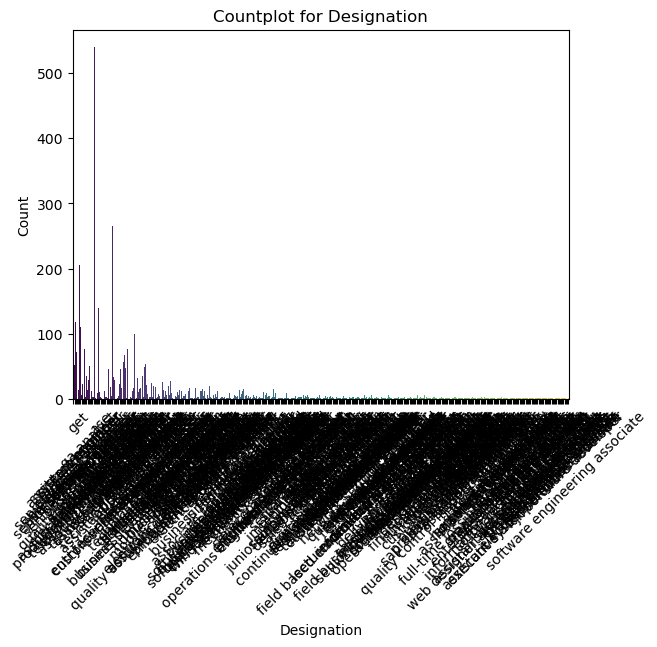

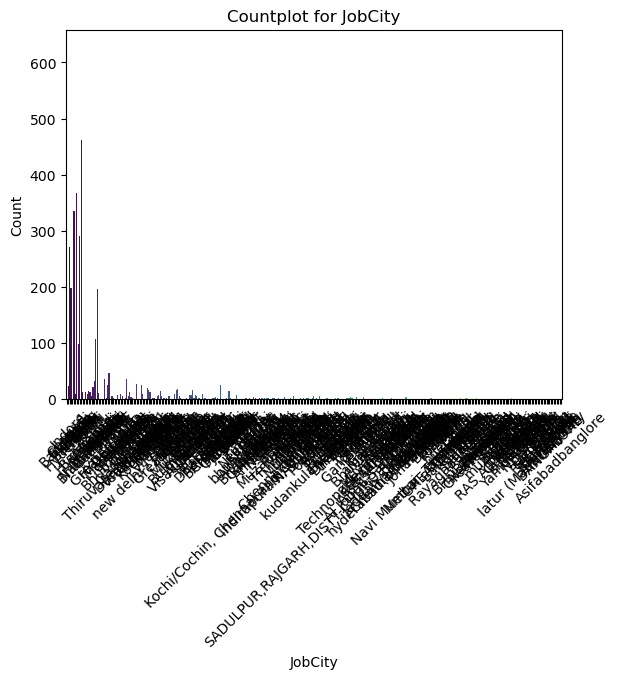

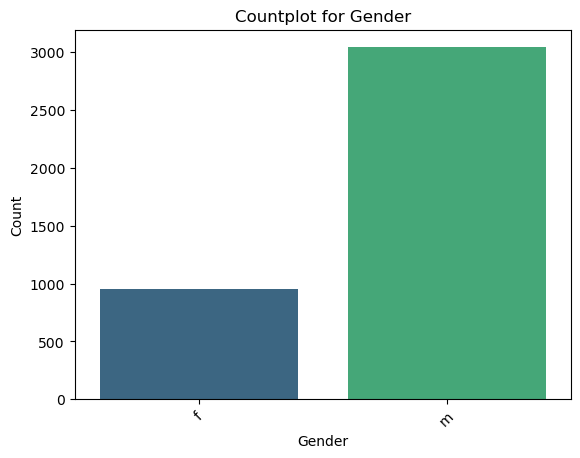

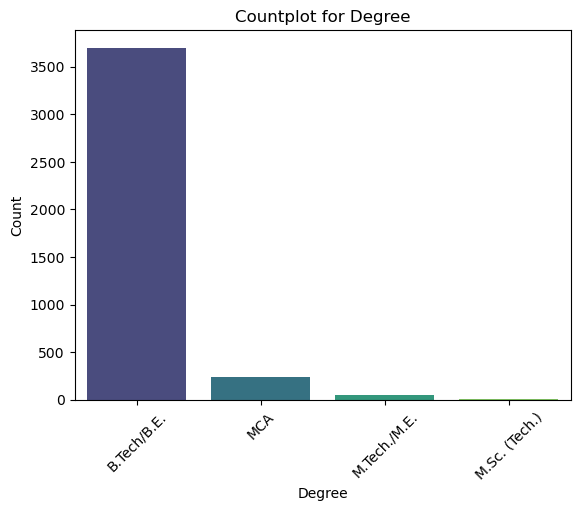

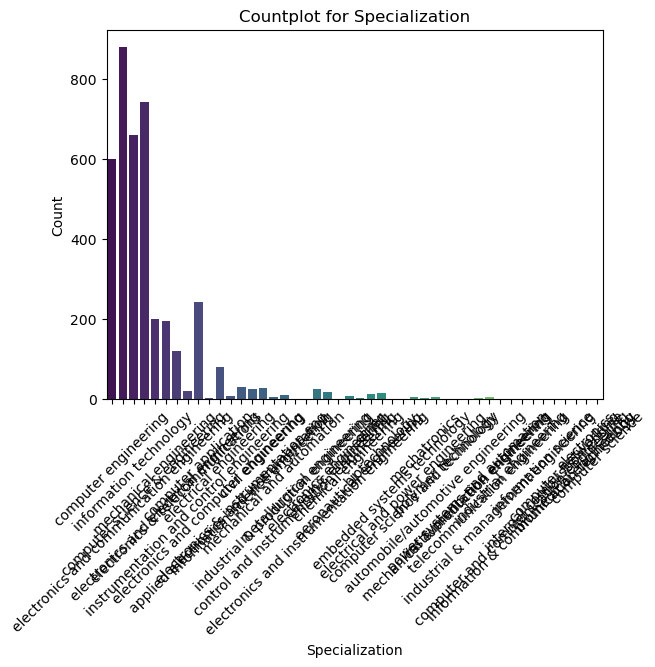

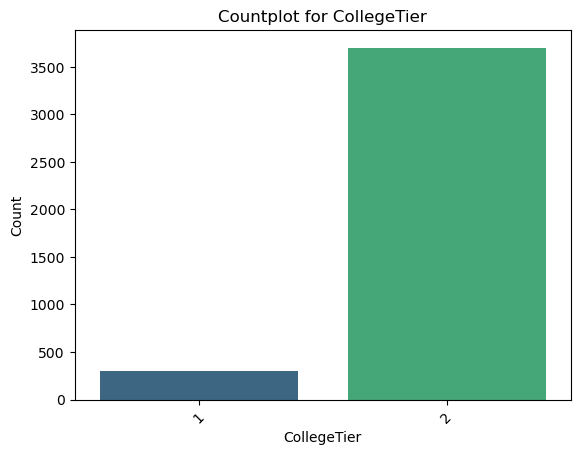

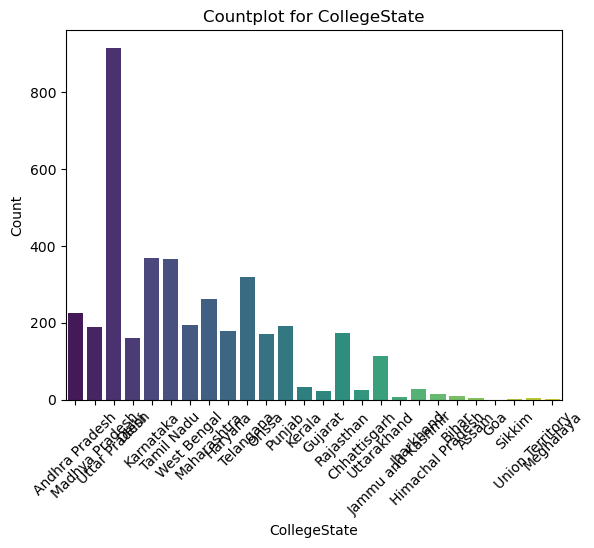

In [11]:
for col in categorical_cols:
    sns.countplot(x=df[col], palette='viridis')
    plt.title(f'Countplot for {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

In [12]:
def detect_outliers_iqr(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = column[(column < lower_bound) | (column > upper_bound)]
    return outliers

# Find outliers for each numerical column
outliers_dict = {}
for col in numerical_cols:
    outliers = detect_outliers_iqr(df[col])
    outliers_dict[col] = outliers

# Display outliers for each numerical column
for col, outliers in outliers_dict.items():
    print(f'Outliers in column "{col}":')
    print(outliers)
    print('\n')

Outliers in column "Salary":
3       1100000.0
76       800000.0
92      1500000.0
123     1200000.0
128      675000.0
          ...    
3823     775000.0
3904     850000.0
3912     730000.0
3961     700000.0
3992     800000.0
Name: Salary, Length: 109, dtype: float64


Outliers in column "10percentage":
245     50.60
466     44.16
490     44.00
491     45.60
502     48.00
600     49.00
613     48.00
898     49.00
919     48.80
1064    49.00
1102    49.00
1169    48.50
1193    48.00
1235    50.60
1334    43.00
1838    50.00
1845    49.00
1955    45.33
1976    46.24
2037    48.00
2215    50.50
2292    50.00
2432    50.00
2655    50.66
2885    46.80
2982    50.00
3284    50.00
3425    50.00
3690    46.00
3743    49.90
Name: 10percentage, dtype: float64


Outliers in column "12percentage":
3337    40.0
Name: 12percentage, dtype: float64


Outliers in column "collegeGPA":
7        8.58
44      92.10
138      6.63
187     93.00
477     92.00
614     93.60
690     99.93
788      6.80
874    

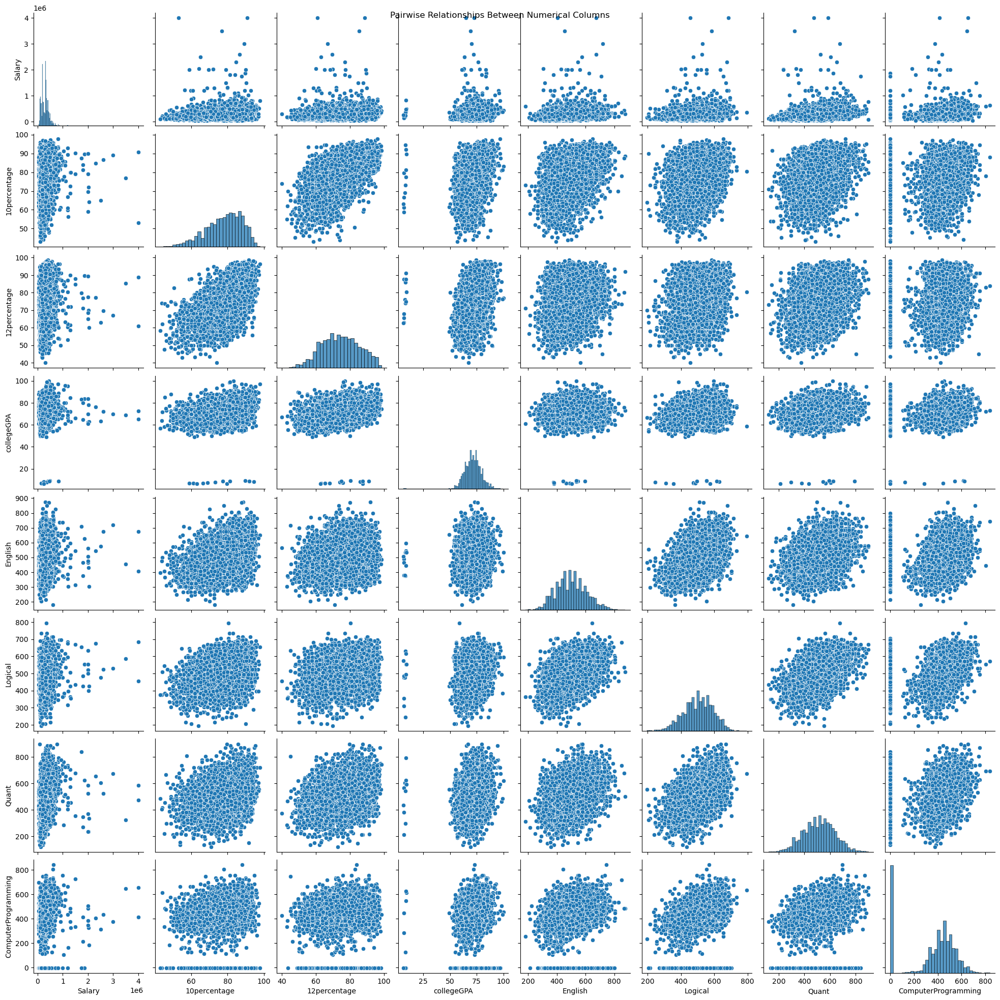

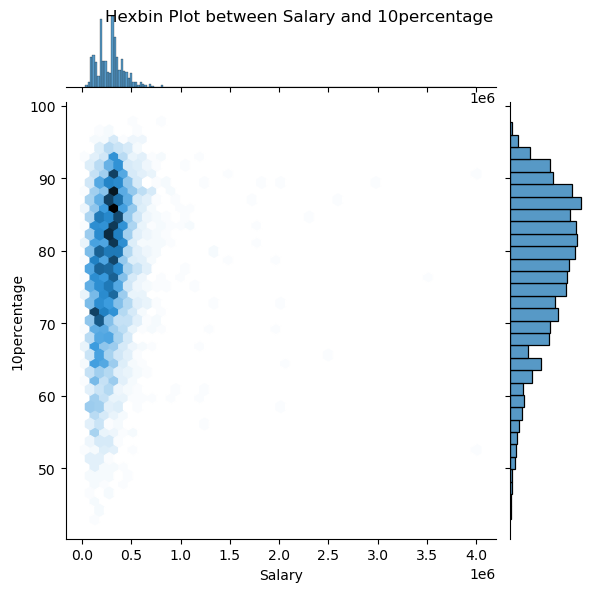

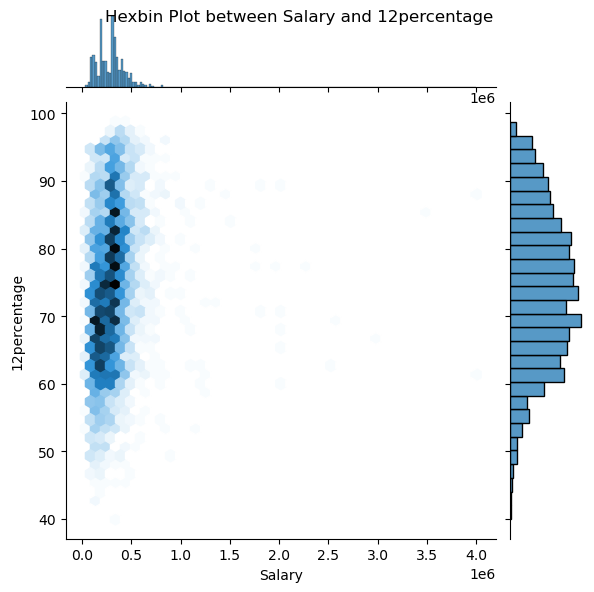

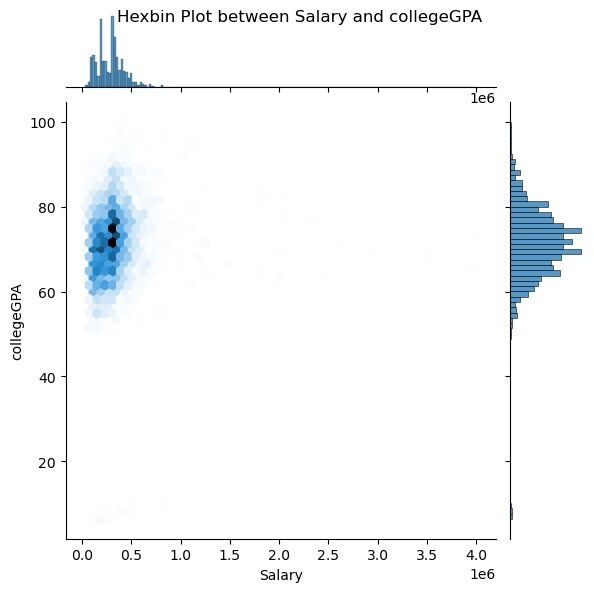

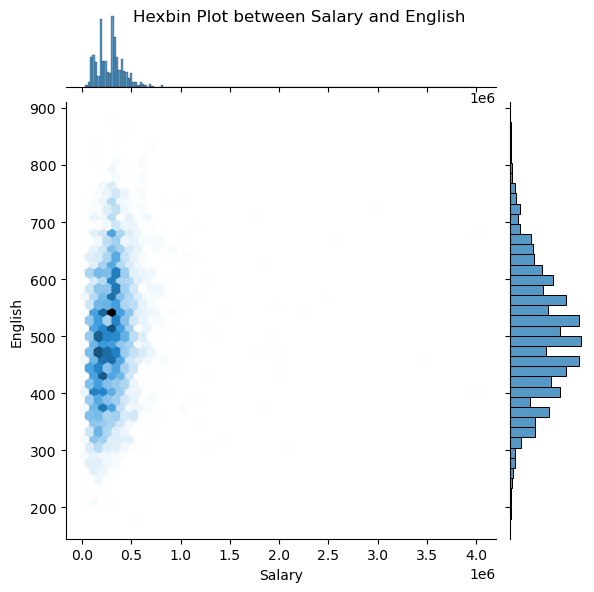

...

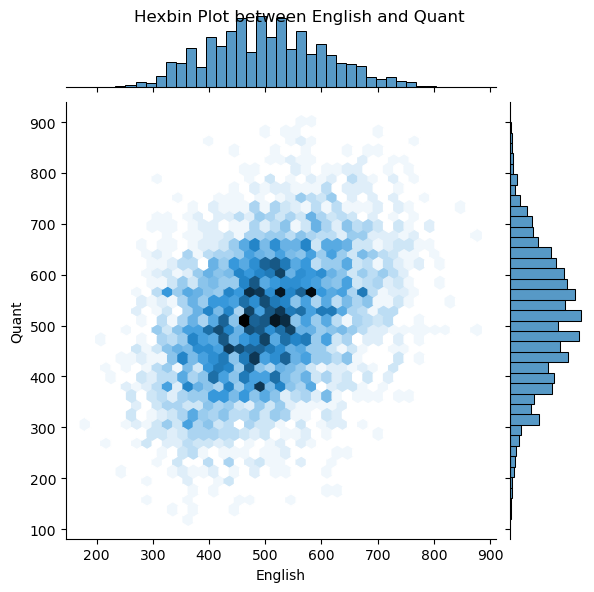

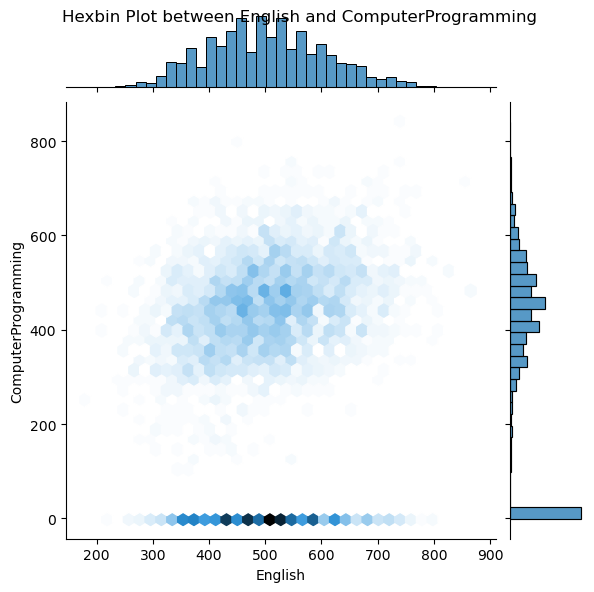

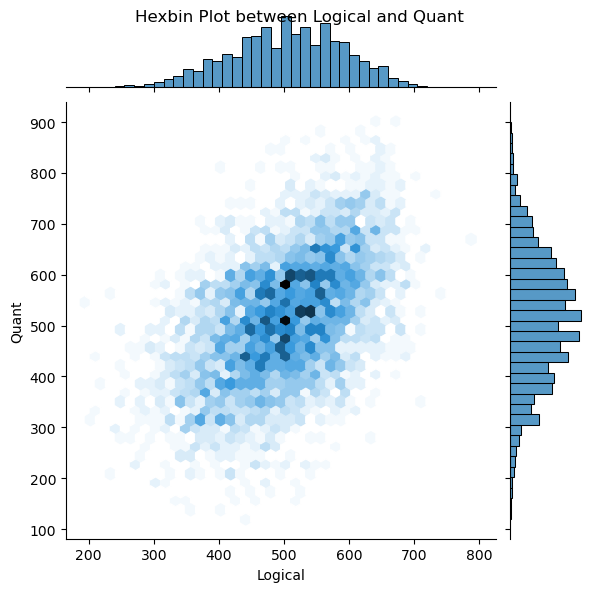

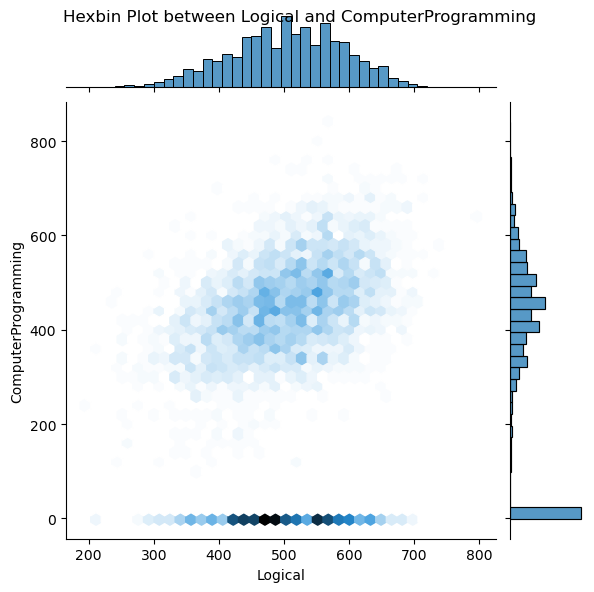

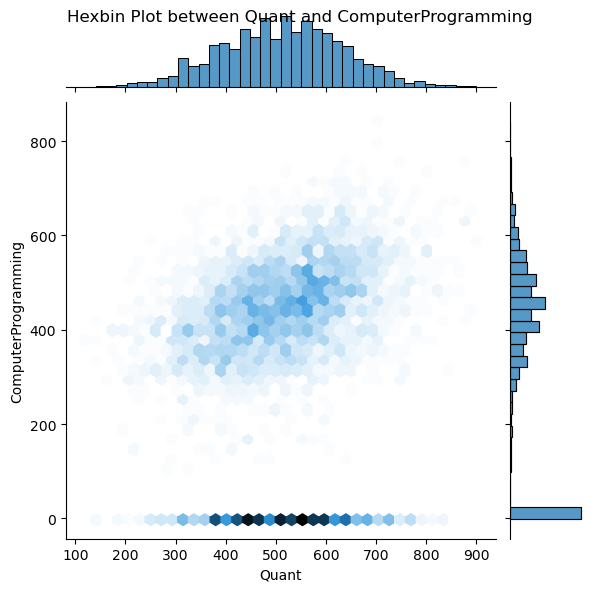

In [13]:
sns.pairplot(df[numerical_cols])
plt.suptitle('Pairwise Relationships Between Numerical Columns')
plt.show()

# Hexbin plots for pairwise relationships
for i in range(len(numerical_cols)):
    for j in range(i + 1, len(numerical_cols)):
        sns.jointplot(x=numerical_cols[i], y=numerical_cols[j], kind='hex', data=df)
        plt.suptitle(f'Hexbin Plot between {numerical_cols[i]} and {numerical_cols[j]}')
        plt.show()

C:\Users\Nihal\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 35.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Nihal\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 32.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Nihal\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 11.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Nihal\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 13.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Nihal\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 46.0% of the points

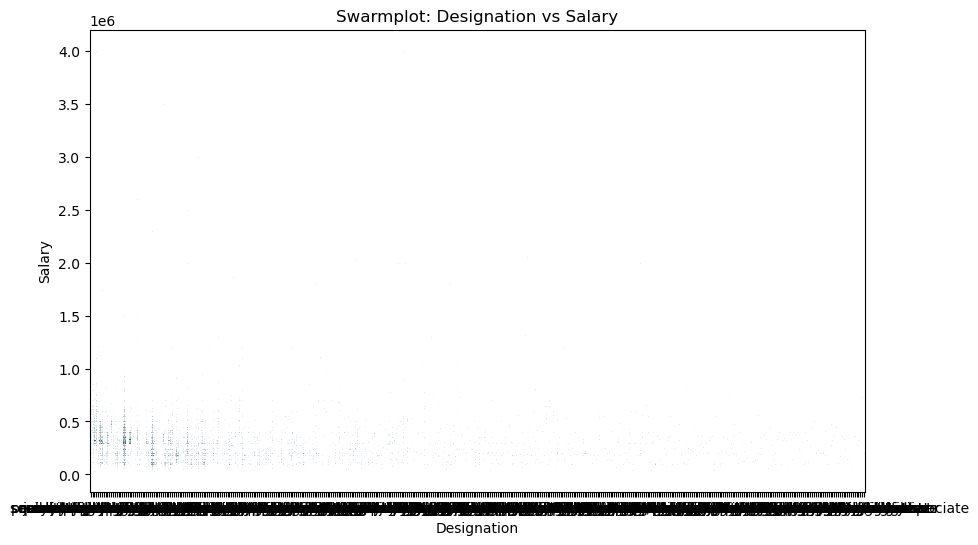

C:\Users\Nihal\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 10.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


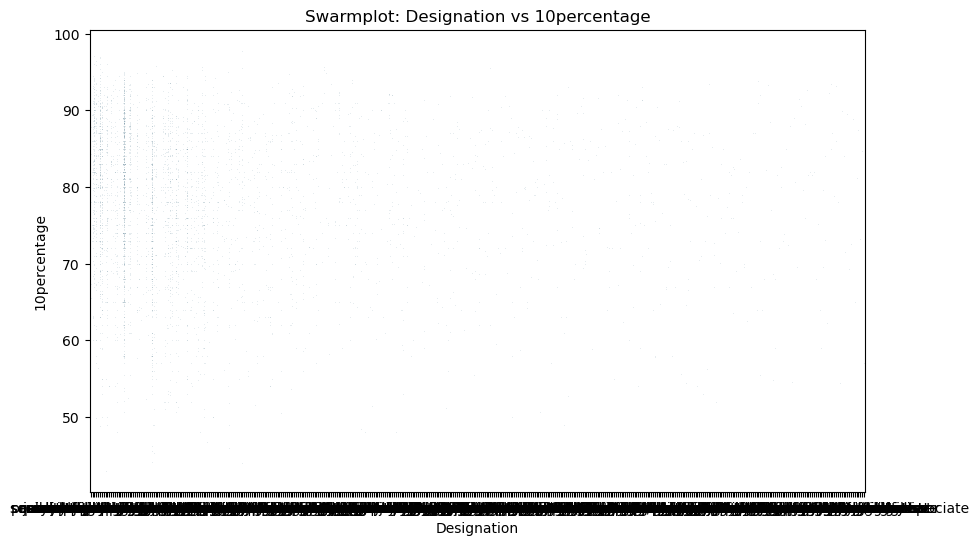

C:\Users\Nihal\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 8.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


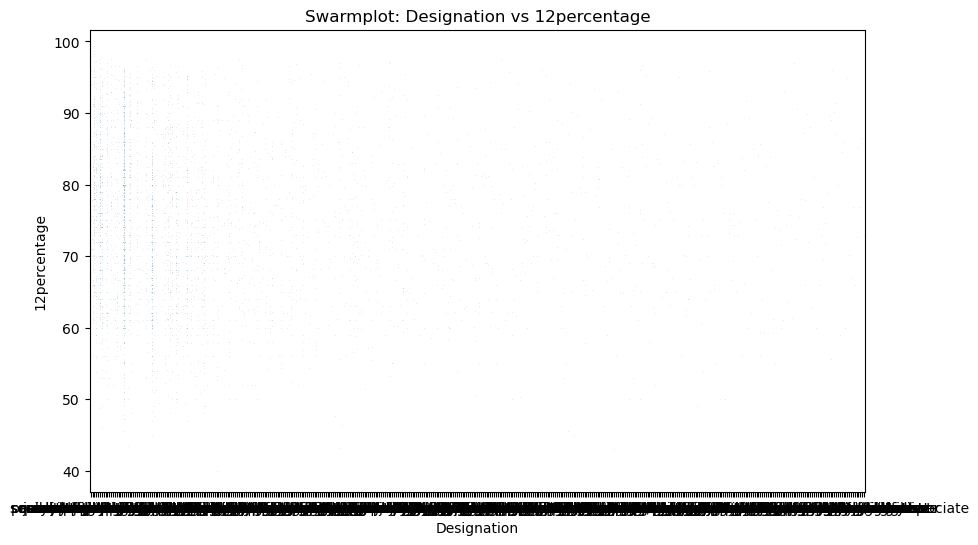

C:\Users\Nihal\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 16.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Nihal\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 7.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Nihal\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 16.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


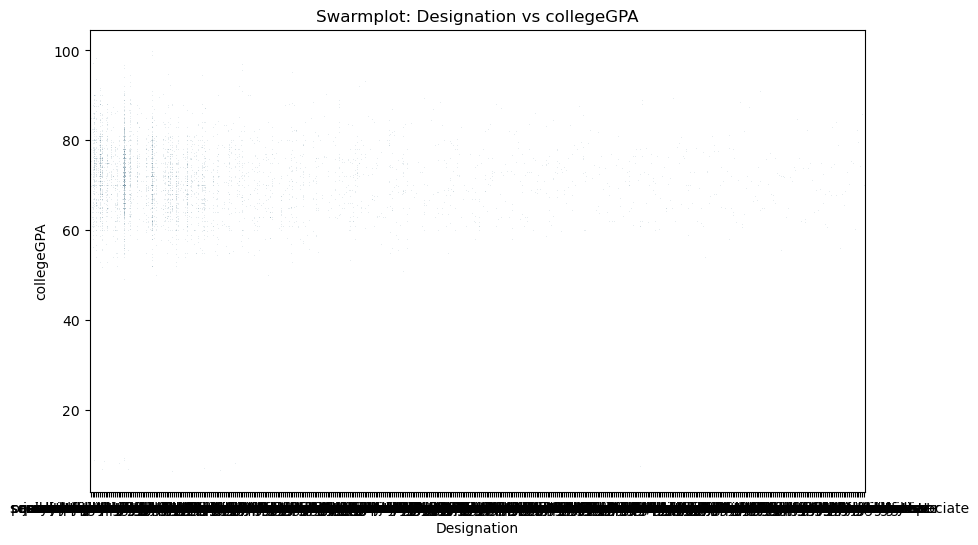

C:\Users\Nihal\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 11.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Nihal\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 44.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Nihal\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 7.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Nihal\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 19.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


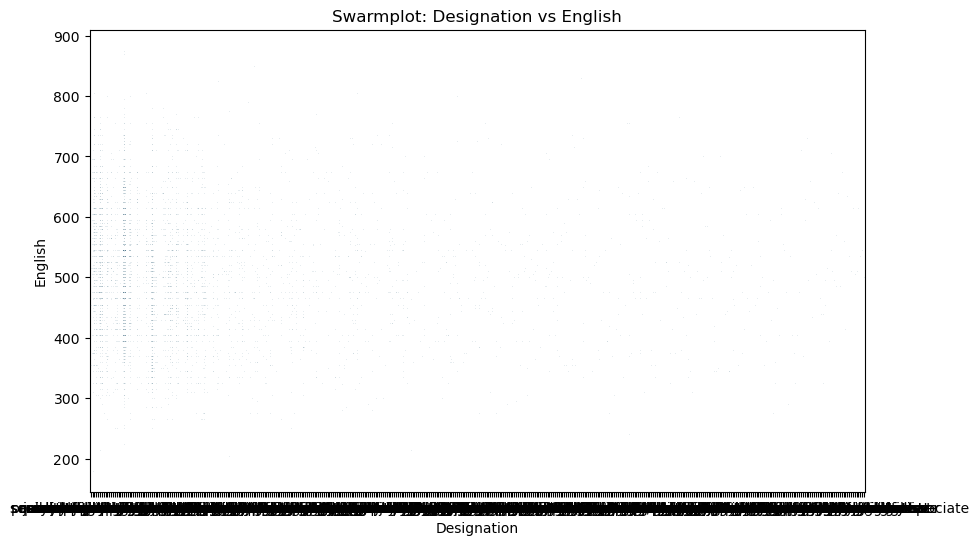

C:\Users\Nihal\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 9.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Nihal\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 5.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Nihal\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 18.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Nihal\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 5.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Nihal\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 47.5% of the points ca

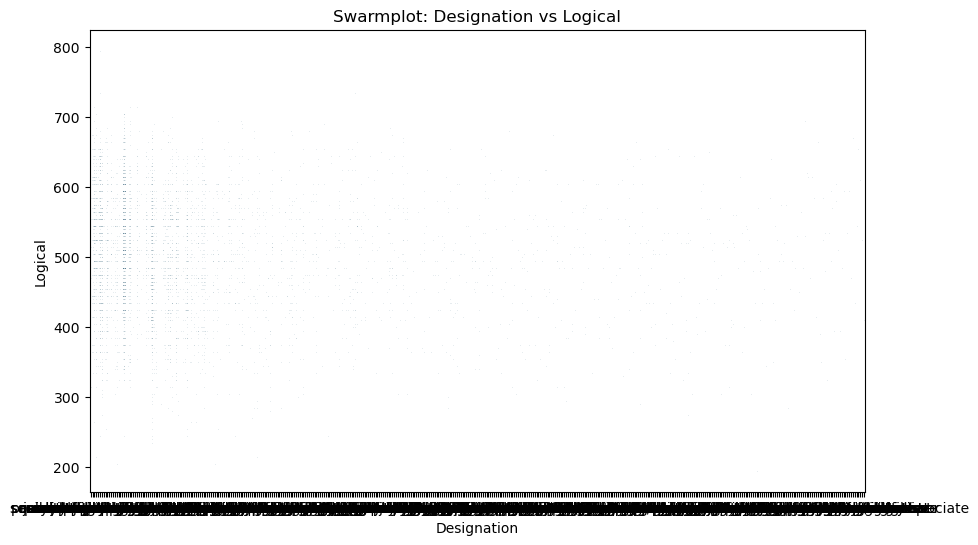

In [ ]:
for cat_col in categorical_cols:
    for num_col in numerical_cols:
        plt.figure(figsize=(10, 6))
        sns.swarmplot(x=cat_col, y=num_col, data=df, size=0.3)
        plt.title(f'Swarmplot: {cat_col} vs {num_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.show()

# # Box plot for categorical vs numerical columns
# for cat_col in categorical_cols:
#     for num_col in numerical_cols:
#         plt.figure(figsize=(10, 6))
#         sns.boxplot(x=cat_col, y=num_col, data=df, size=0.3)
#         plt.title(f'Boxplot: {cat_col} vs {num_col}')
#         plt.xlabel(cat_col)
#         plt.ylabel(num_col)
#         plt.show()

# # Bar plot for categorical vs numerical columns
# for cat_col in categorical_cols:
#     for num_col in numerical_cols:
#         plt.figure(figsize=(10, 6))
#         sns.barplot(x=cat_col, y=num_col, data=df, size=0.3)
#         plt.title(f'Barplot: {cat_col} vs {num_col}')
#         plt.xlabel(cat_col)
#         plt.ylabel(num_col)
#         plt.show()

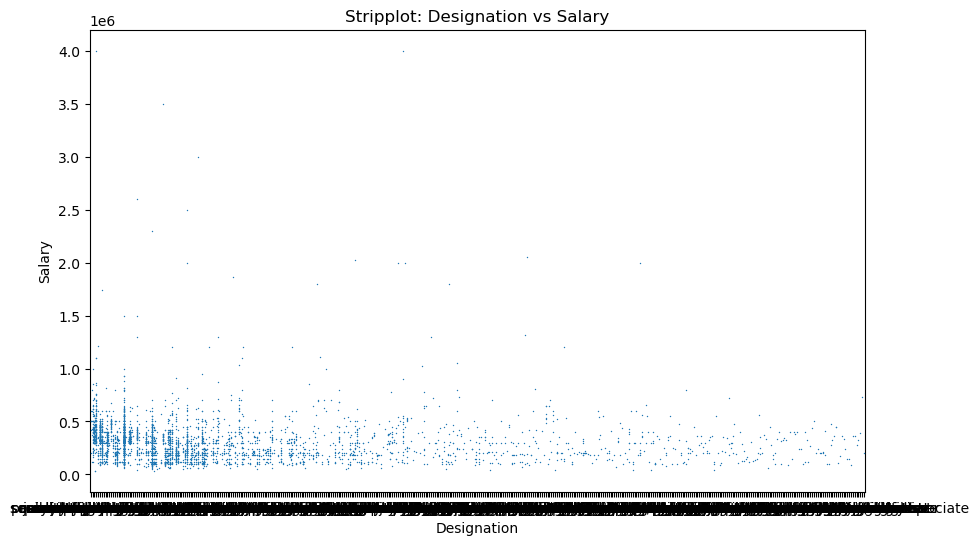

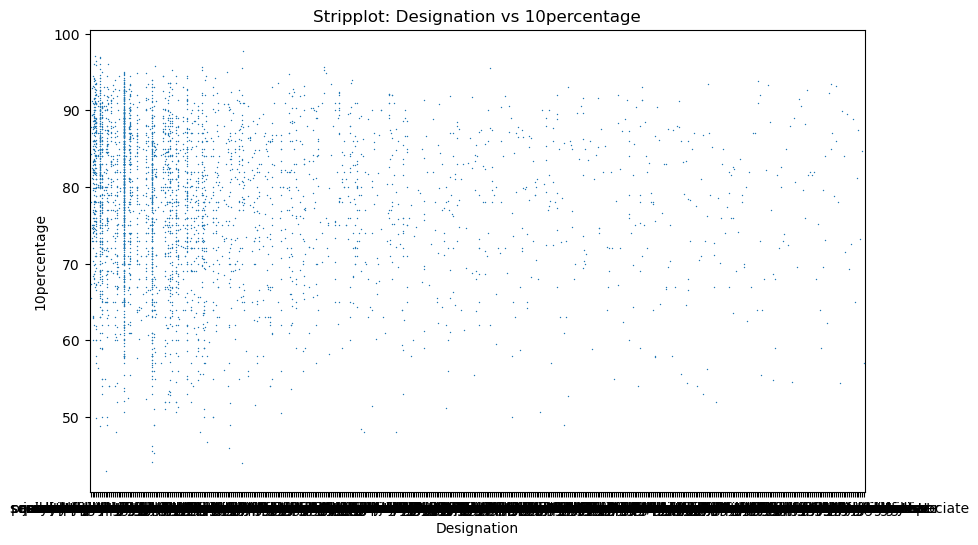

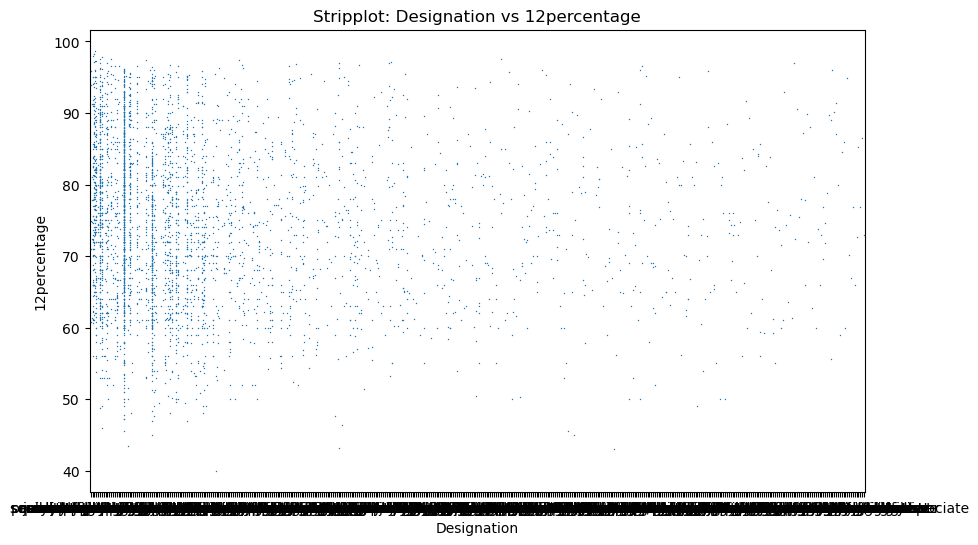

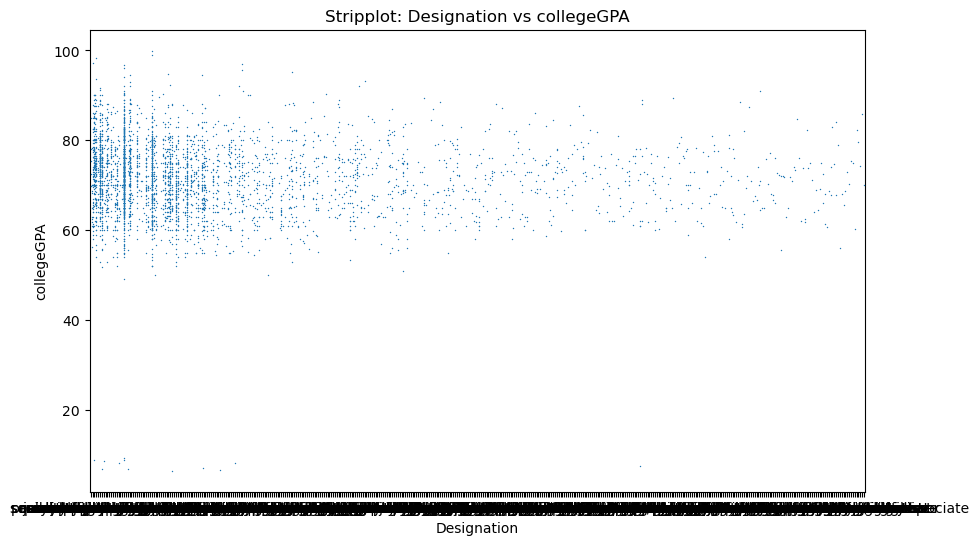

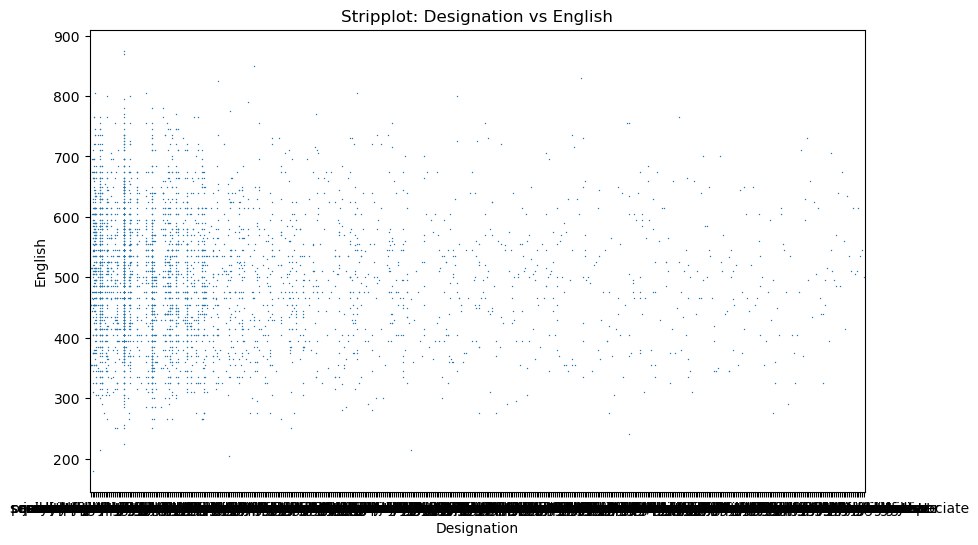

...

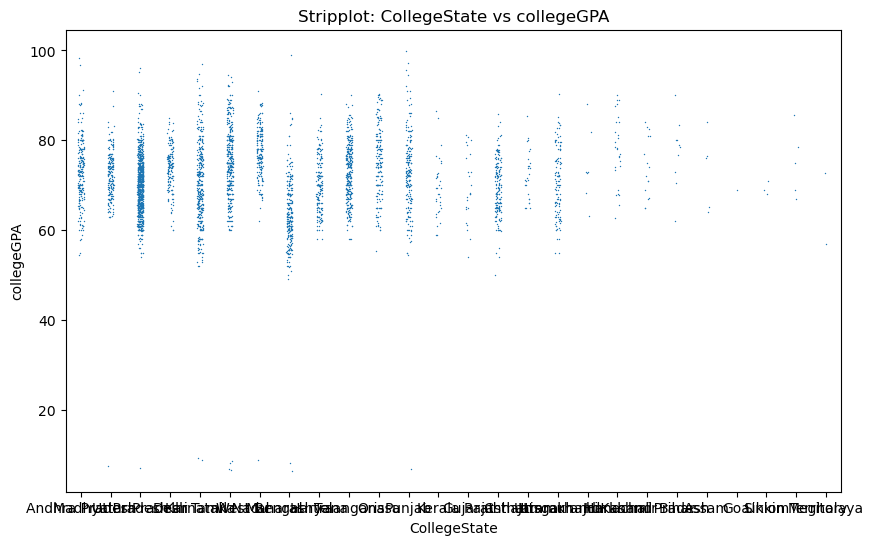

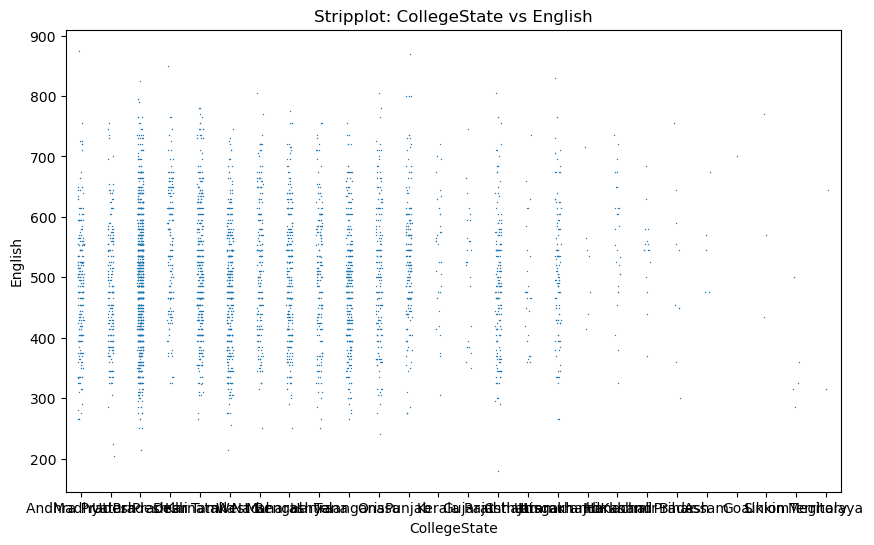

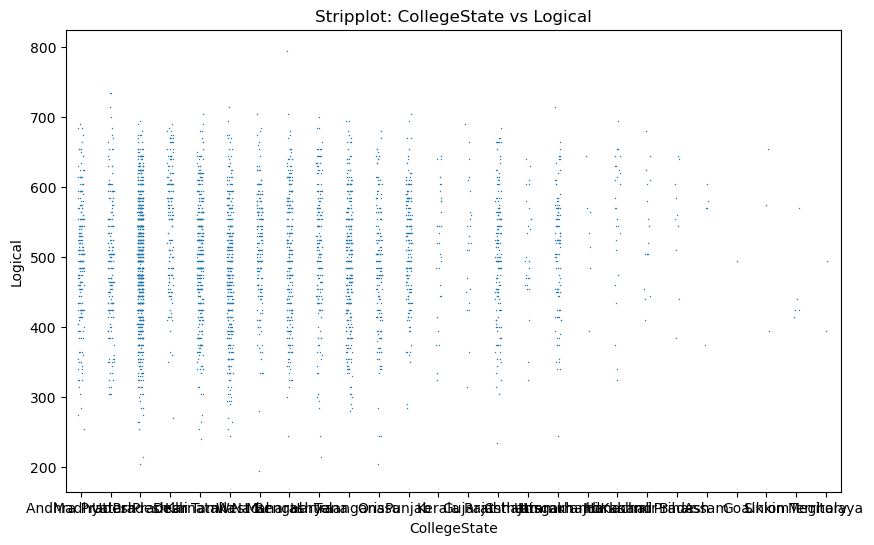

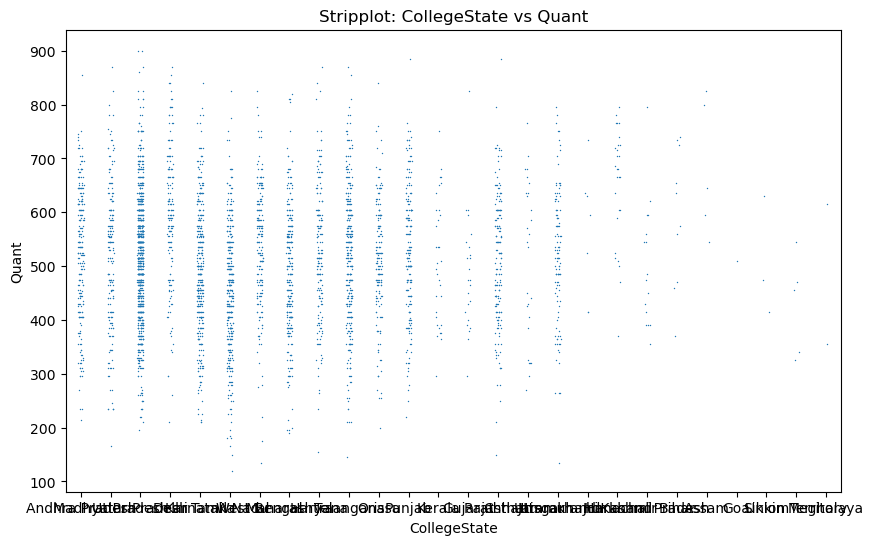

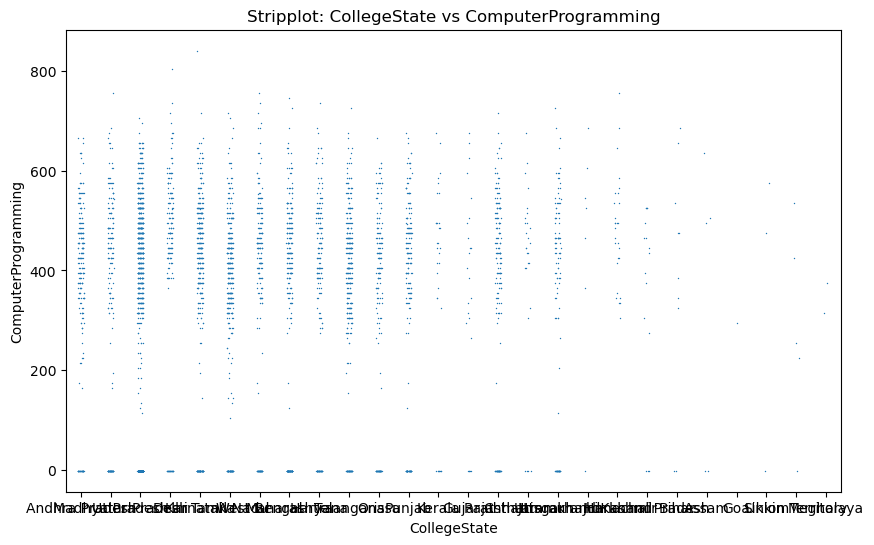

In [3]:
for cat_col in categorical_cols:
    for num_col in numerical_cols:
        plt.figure(figsize=(10, 6))
        sns.stripplot(x=cat_col, y=num_col, data=df, size=1) 
        plt.title(f'Stripplot: {cat_col} vs {num_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.show()

<Figure size 1000x600 with 0 Axes>

C:\Users\Nihal\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


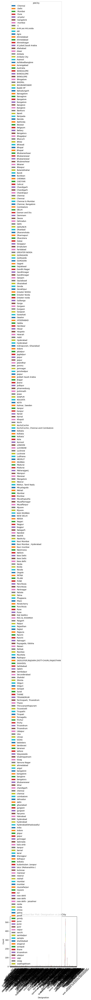

<Figure size 1000x600 with 0 Axes>

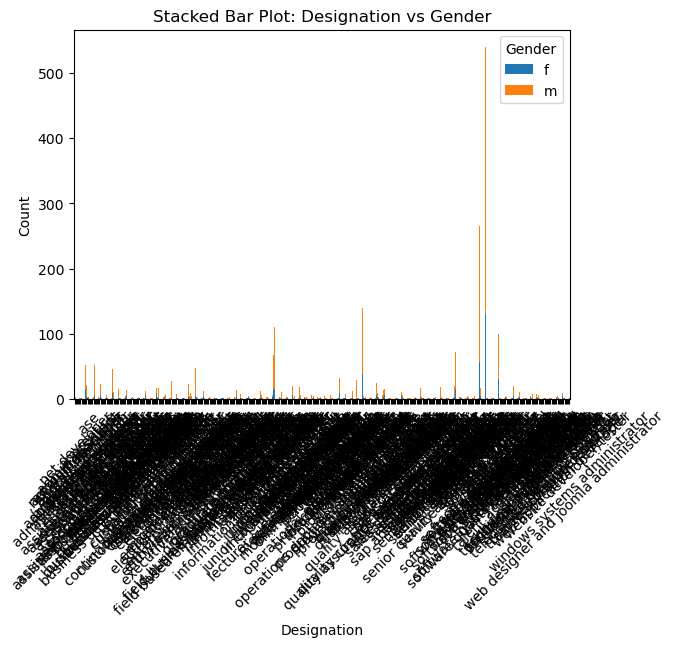

<Figure size 1000x600 with 0 Axes>

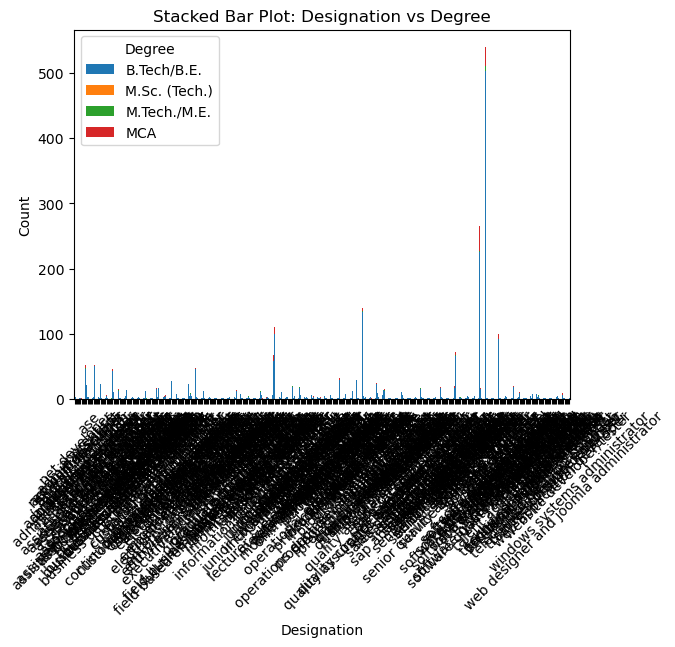

<Figure size 1000x600 with 0 Axes>

C:\Users\Nihal\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


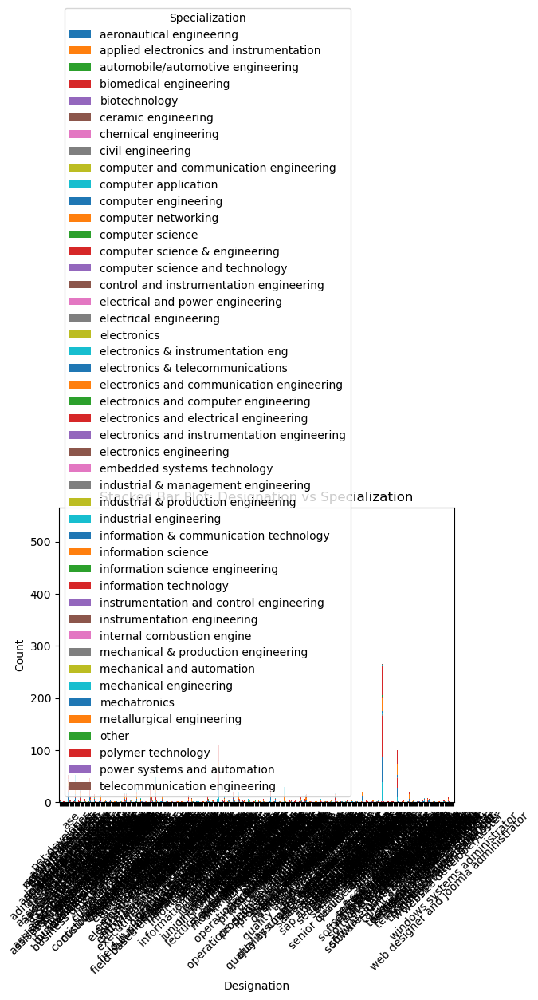

<Figure size 1000x600 with 0 Axes>

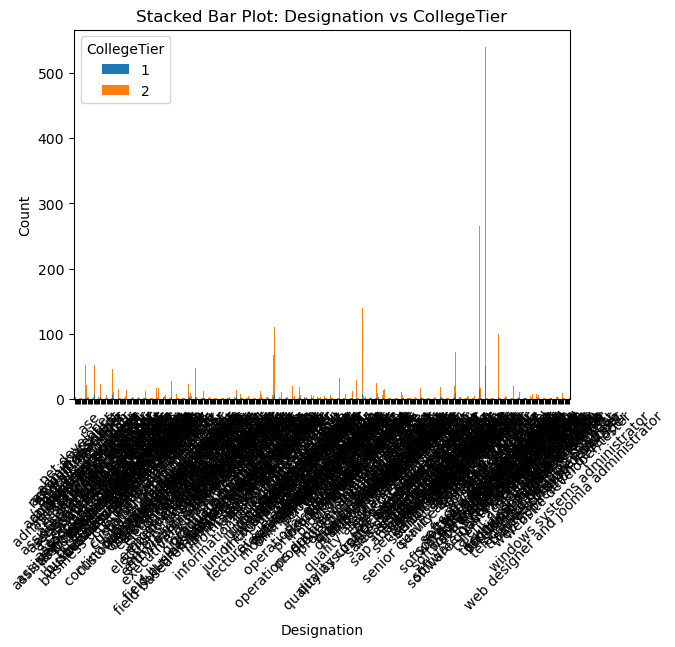

<Figure size 1000x600 with 0 Axes>

C:\Users\Nihal\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


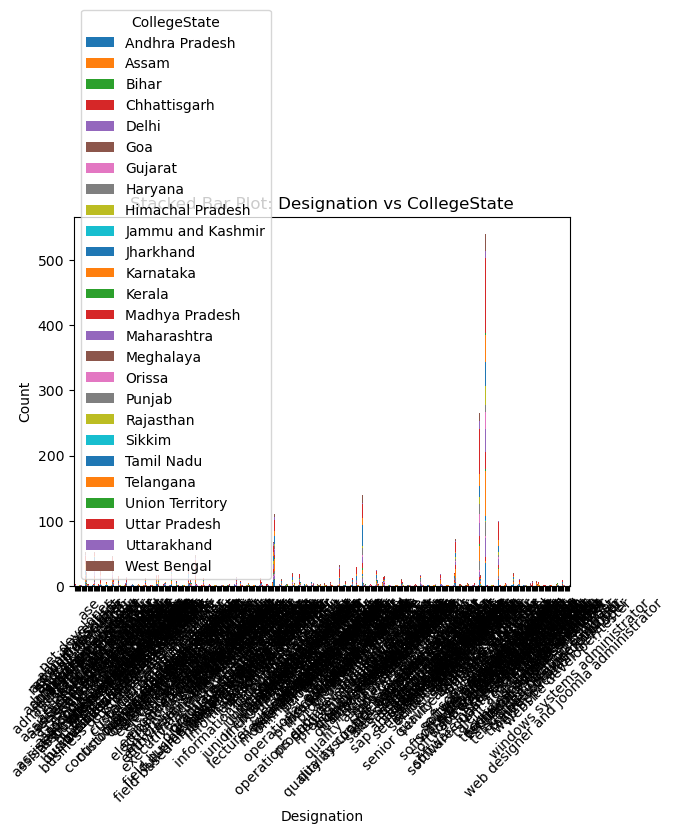

<Figure size 1000x600 with 0 Axes>

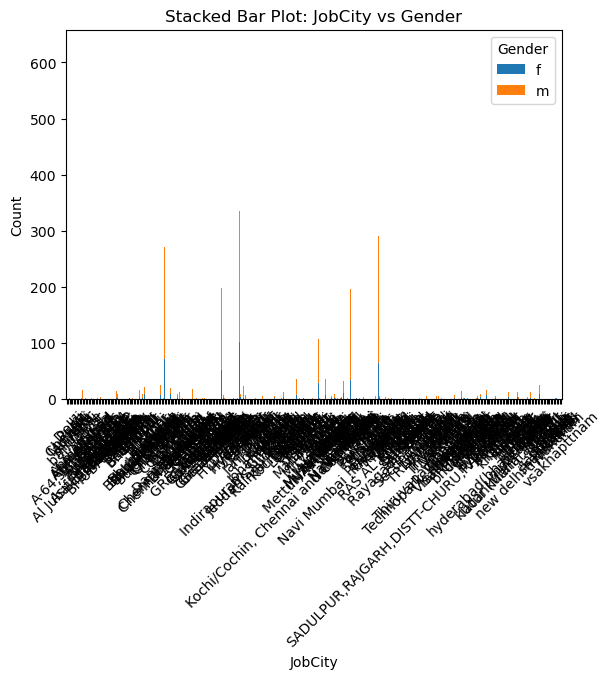

<Figure size 1000x600 with 0 Axes>

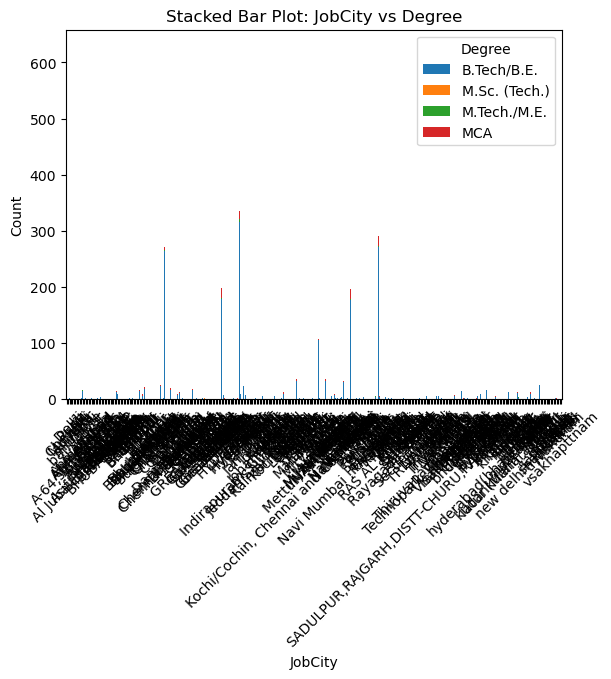

<Figure size 1000x600 with 0 Axes>

C:\Users\Nihal\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


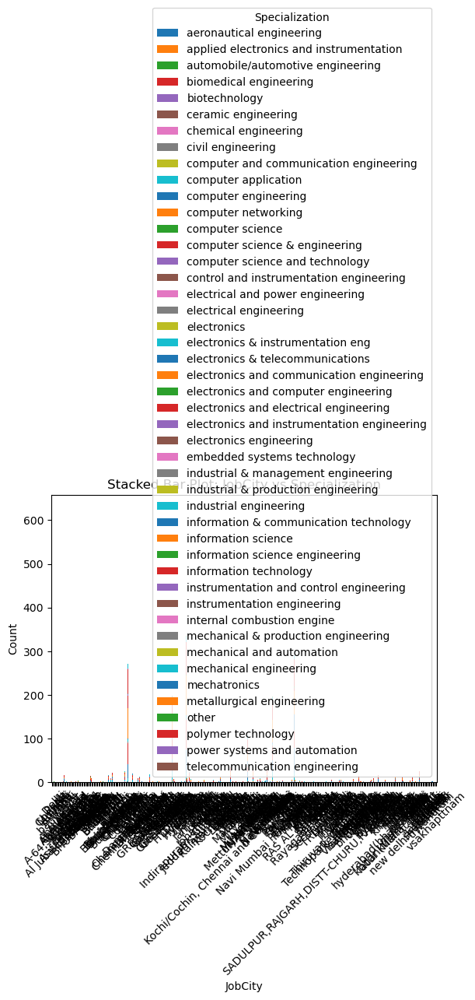

<Figure size 1000x600 with 0 Axes>

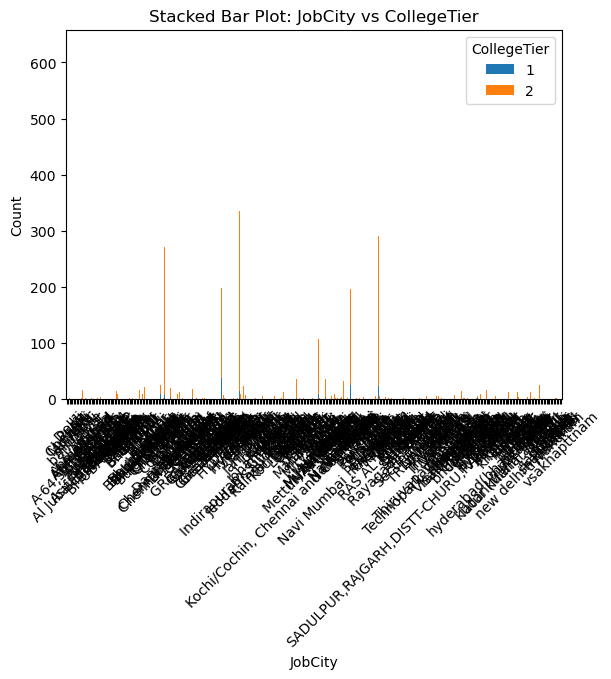

<Figure size 1000x600 with 0 Axes>

C:\Users\Nihal\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


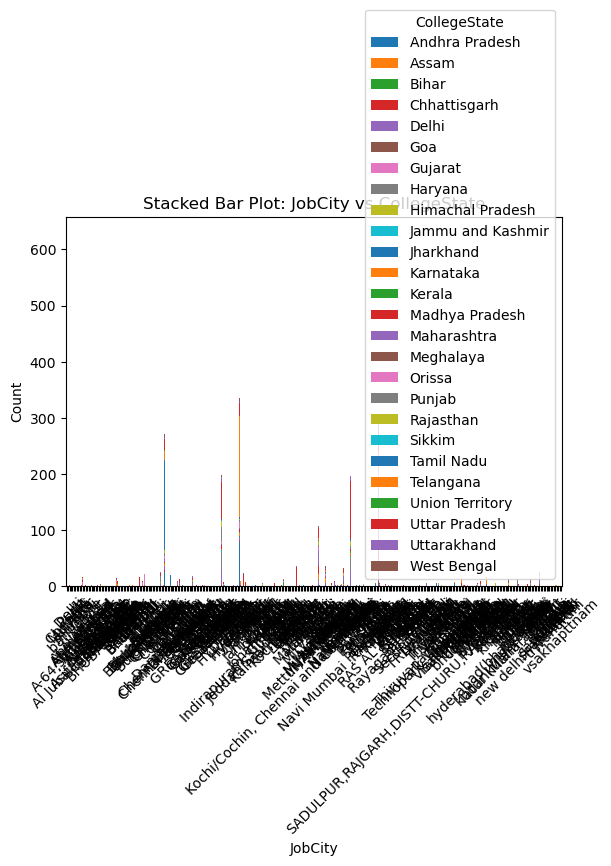

<Figure size 1000x600 with 0 Axes>

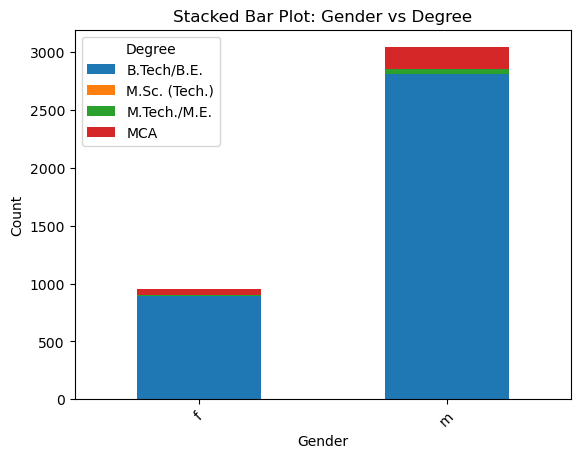

<Figure size 1000x600 with 0 Axes>

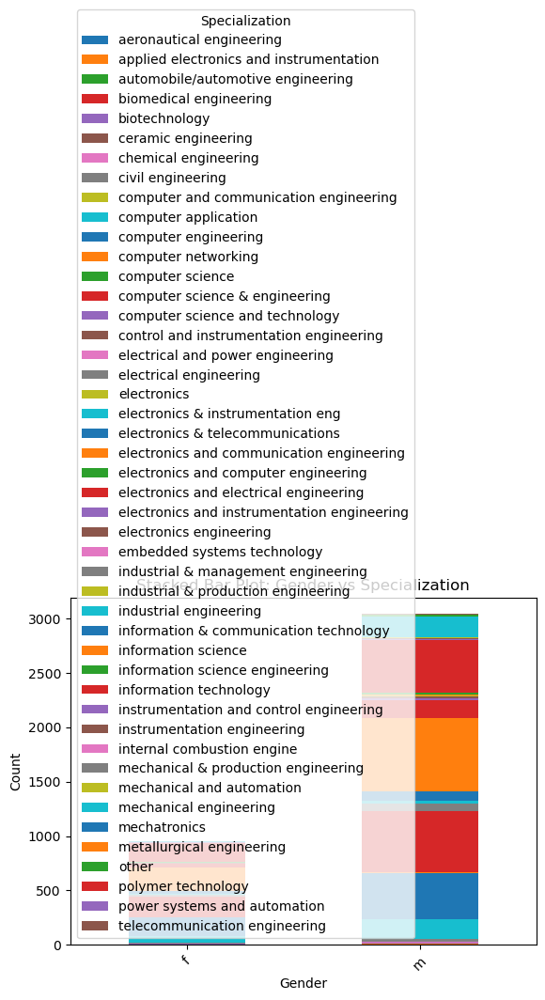

<Figure size 1000x600 with 0 Axes>

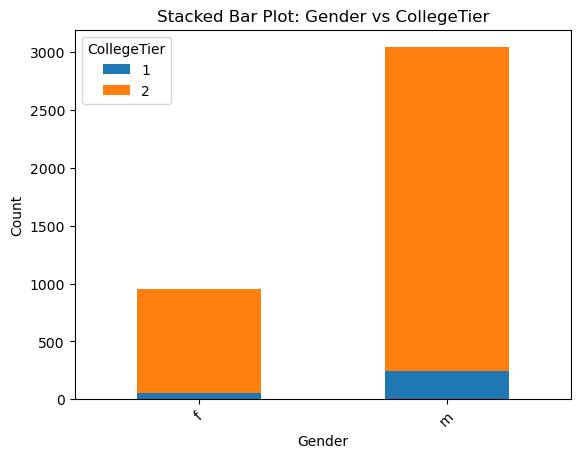

<Figure size 1000x600 with 0 Axes>

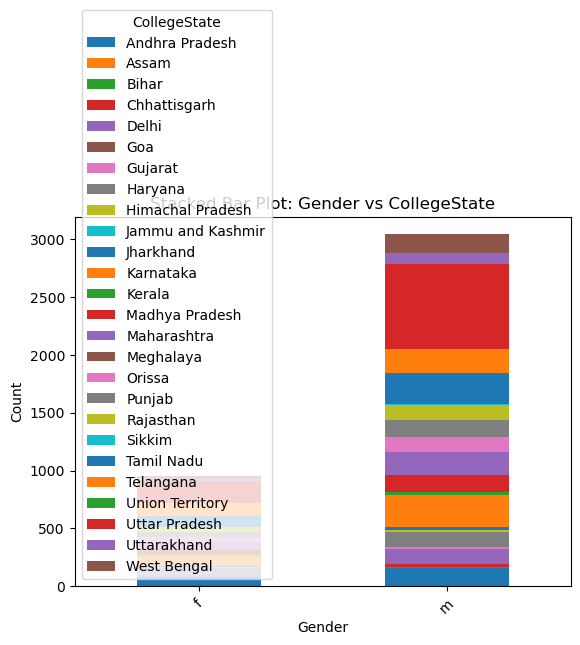

<Figure size 1000x600 with 0 Axes>

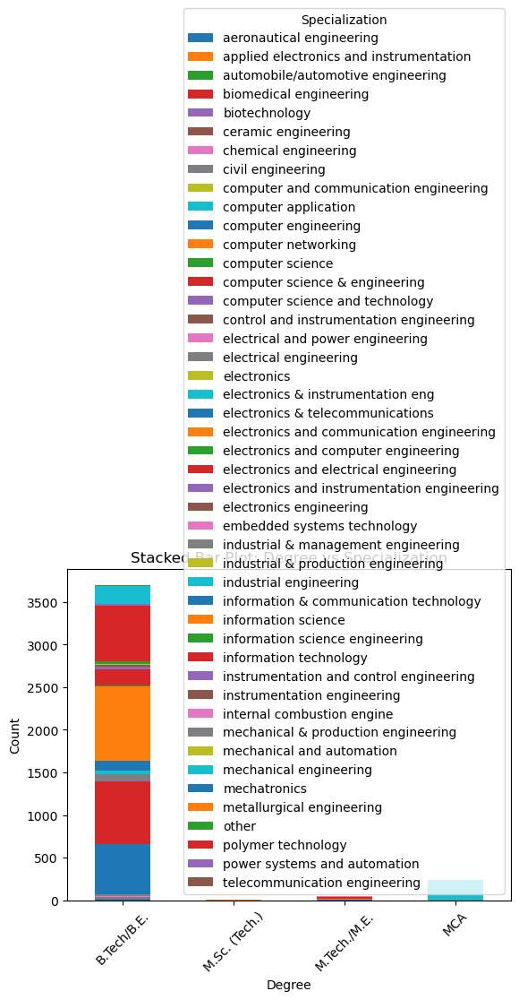

<Figure size 1000x600 with 0 Axes>

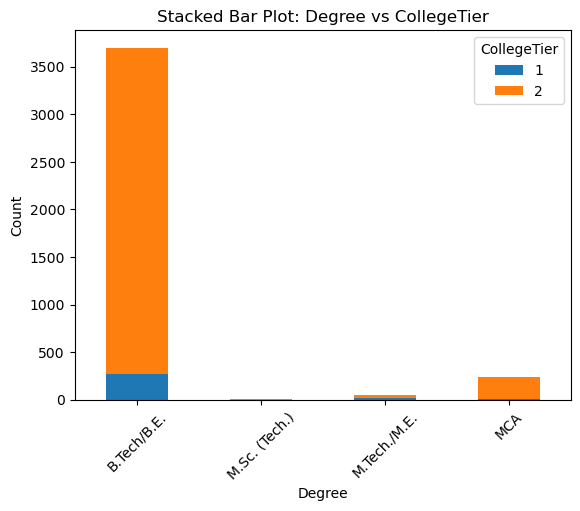

<Figure size 1000x600 with 0 Axes>

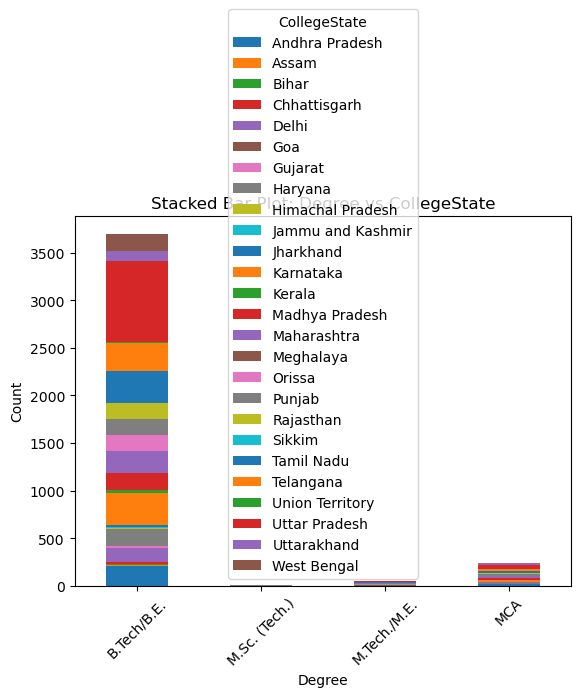

<Figure size 1000x600 with 0 Axes>

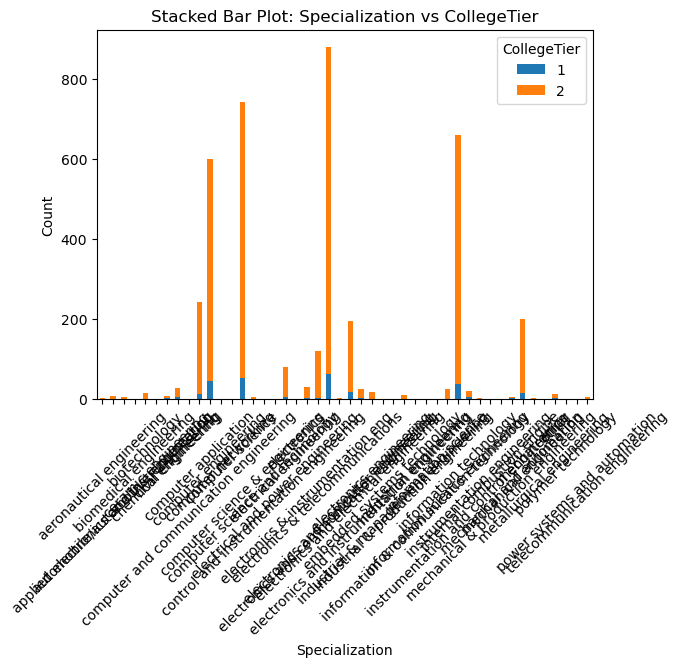

<Figure size 1000x600 with 0 Axes>

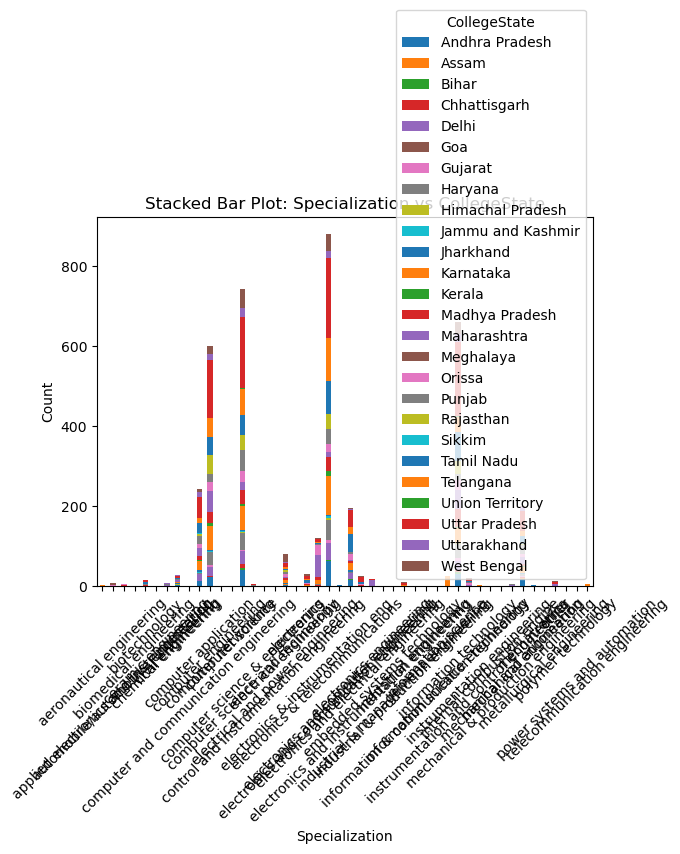

<Figure size 1000x600 with 0 Axes>

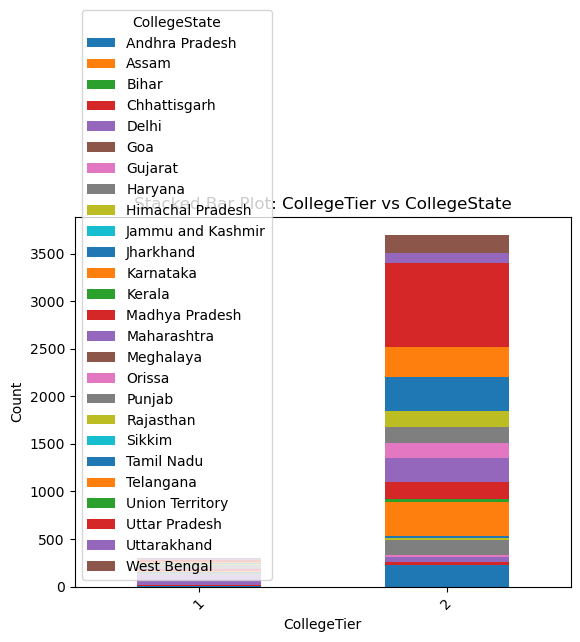

In [4]:
for i in range(len(categorical_cols)):
    for j in range(i + 1, len(categorical_cols)):
        crosstab_df = pd.crosstab(df[categorical_cols[i]], df[categorical_cols[j]])
        plt.figure(figsize=(10, 6))
        crosstab_df.plot(kind='bar', stacked=True)
        plt.title(f'Stacked Bar Plot: {categorical_cols[i]} vs {categorical_cols[j]}')
        plt.xlabel(categorical_cols[i])
        plt.ylabel('Count')
        plt.xticks(rotation=45)
        plt.legend(title=categorical_cols[j])
        plt.show()

In [6]:
agg_data = df.groupby(categorical_cols)[numerical_cols].sum().reset_index()

plt.figure(figsize=(10, 6))
sns.barplot(x=categorical_cols, y=numerical_cols, data=agg_data, palette='viridis')
plt.title(f'Stacked Bar Plot: {numerical_cols} by {categorical_cols}')
plt.xlabel(categorical_cols)
plt.ylabel(numerical_cols)
plt.show()

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

<Figure size 1000x600 with 0 Axes>

In [3]:
average_salary = df['Salary'].mean()
print("Average Salary:", average_salary)

Average Salary: 307699.8499249625


In [8]:
desired_designations = ['programming analyst', 'software engineer', 'hardware engineer', 'associate engineer']
filtered_df = df[df['Designation'].isin(desired_designations)]

# Extract the 'Salary' and 'Designation' columns
desired_columns = ['Salary', 'Designation']
result_df = filtered_df[desired_columns]

print(result_df)

        Salary        Designation
19    325000.0  software engineer
20    320000.0  software engineer
21    200000.0  software engineer
31    340000.0  software engineer
36    270000.0  software engineer
...        ...                ...
3979  550000.0  software engineer
3981  220000.0  software engineer
3984  480000.0  software engineer
3989  300000.0  software engineer
3993  280000.0  software engineer

[553 rows x 2 columns]


In [9]:
avg_sal = result_df['Salary'].mean()
print("Average Salary:", avg_sal)

Average Salary: 339792.0433996383


In [10]:
min_salary = result_df['Salary'].min()
max_salary = result_df['Salary'].max()

In [11]:
print("Minimum Salary:", min_salary)
print("Maximum Salary:", max_salary)

Minimum Salary: 60000.0
Maximum Salary: 1500000.0


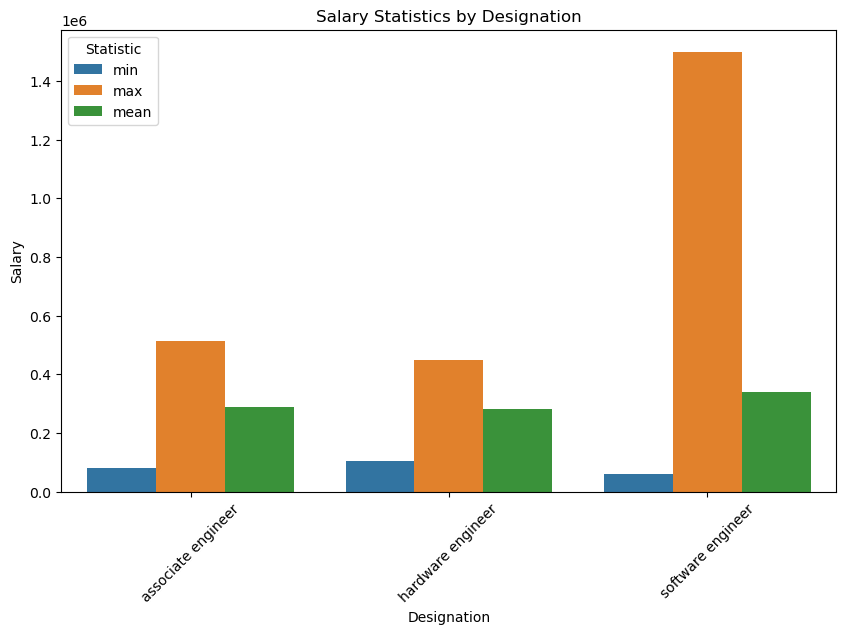

In [13]:
salary_stats = result_df.groupby('Designation')['Salary'].agg(['min', 'max', 'mean']).reset_index()

# Melt the DataFrame to long format
salary_stats_melted = pd.melt(salary_stats, id_vars='Designation', var_name='Statistic', value_name='Salary')

# Create bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x='Designation', y='Salary', hue='Statistic', data=salary_stats_melted)
plt.title('Salary Statistics by Designation')
plt.xlabel('Designation')
plt.ylabel('Salary')
plt.xticks(rotation=45)
plt.legend(title='Statistic')
plt.show()

In [16]:
plt.savefig('Salary_Statistics_by_Designation.png')

<Figure size 640x480 with 0 Axes>